# Video Writing

While building applications, it becomes important to save demo videos of your work as well as many applications themselves might require saving a video clip. For example, in a surveiallance application, you might have to save a video clip as soon as you see something unusual happening.

In this notebook, we will describe how to save a video in avi and mp4 formats using openCV.

## Import the Libraries

In [1]:
import cv2
import matplotlib.pyplot as plt

from IPython.display import Video, display

%matplotlib inline

## Read from Source

In [2]:
source = 'datos/VideoWriting/back_to_the_future.mp4' 

cap = cv2.VideoCapture(source)

In [3]:
if not cap.isOpened():
    print("Error opening video stream or file")

## Read and Display One Frame

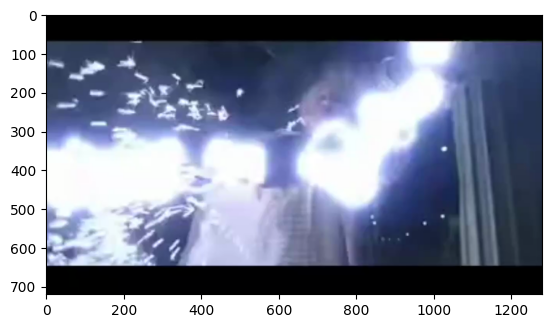

In [4]:
ret, frame = cap.read()
plt.imshow(frame[..., ::-1])

## Display the Video File

In [5]:
video_path = 'datos/VideoWriting/back_to_the_future.mp4'

# Show the video in the notebook
video = Video(video_path, width=700, height=438, embed=True)
display(video)

## Write Video using OpenCV
For writing the video, you need to create a videowriter object with the right parameters.

**Function Syntax**

```python
VideoWriter object = cv.VideoWriter(filename, fourcc, fps, frameSize )
```
where,
**Parameters**

1. `filename`: Name of the output video file.

2. `fourcc`: 4-character code of codec used to compress the frames. For example, `VideoWriter::fourcc('P','I','M','1')` is a MPEG-1 codec, VideoWriter::fourcc('M','J','P','G') is a motion-jpeg codec etc. List of codes can be obtained at Video Codecs by FOURCC page. FFMPEG backend with MP4 container natively uses other values as fourcc code: see ObjectType, so you may receive a warning message from OpenCV about fourcc code conversion.

3. `fps`: Framerate of the created video stream.

4. `frameSize`: Size of the video frames.

In [6]:
# Default resolutions of the frame are obtained.
# Convert the resolutions from float to integer.
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))

frame_size = (frame_width, frame_height)

# Write the video with codec MJPG, 10 fps and the same size as the original video 
out_avi = cv2.VideoWriter("datos/VideoWriting/Saved/back_to_the_future_out.avi", cv2.VideoWriter_fourcc("M", "J", "P", "G"), 10, frame_size)
# Write the video with codec XVID, 10 fps and the same size as the original video 
out_mp4 = cv2.VideoWriter("datos/VideoWriting/Saved/back_to_the_future_out.mp4", cv2.VideoWriter_fourcc(*"mp4v"), 10, frame_size)

### Read frames and write to file

We will read the frames from the back to the future video and write the same to the two objects we created in the previous step. We should release the objects after the task is complete.

In [7]:
# Read until video is completed
while cap.isOpened():
    # Capture frame-by-frame
    ret, frame = cap.read()

    if ret:
        # Write the frame to the output files
        out_avi.write(frame)
        out_mp4.write(frame)

    # Break the loop
    else:
        break

In [8]:
# When everything done, release the VideoCapture and VideoWriter objects
cap.release()
out_avi.release()
out_mp4.release()

## Display Written Video

To display the created video directly in the notebook, it is necessary to ensure that the video's codec is compatible with the playback capabilities of the environment. In this case, the H.264 codec (commonly represented as avc1) was selected because it is widely supported by most modern platforms, including Jupyter Notebooks.

In [9]:
input_video = "datos/VideoWriting/Saved/back_to_the_future_out.mp4"
output_video = "datos/VideoWriting/Saved/back_to_the_future_out_h264.mp4"

# Read the input video
cap = cv2.VideoCapture(input_video)

# Get the video properties of the input video
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
frame_size = (frame_width, frame_height)

# Define the codec and create VideoWriter object of the output video
fourcc = cv2.VideoWriter_fourcc(*'avc1')
out = cv2.VideoWriter(output_video, fourcc, fps, frame_size)

# Read the input video and write to the output video
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    out.write(frame)

# release both the VideoCapture and VideoWriter objects
cap.release()
out.release()

print("Video convertido a H.264 (avc1).")

Video convertido a H.264 (avc1).


In [10]:
video_path = 'datos/VideoWriting/Saved/back_to_the_future_out_h264.mp4'

# Show the video in the notebook
video = Video(video_path, width=700, height=438, embed=True)
display(video)